In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
%cd '/content/drive/MyDrive/meeting_assistant'

/content/drive/MyDrive/meeting_assistant


In [ ]:
# Restart runtime after running this cell
!pip install pyannote.core
!pip install pyannote.audio
!pip install google-cloud-speech

# Call meeting assistant's full pipeline function

In [ ]:
from main import full_pipeline
input = './data/test/meeting.wav'
full_pipeline(input)

/usr/local/lib/python3.7/dist-packages/pyannote/audio/embedding/approaches/arcface_loss.py:170: FutureWarning:

The 's' parameter is deprecated in favor of 'scale', and will be removed in a future release

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:652: UserWarning:

Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)



[INFO]Number of Speakers: 4
[INFO]Speaker Diarization Time taken: 49.32 seconds
[INFO]Speech Recognition Time Taken: 51.17 seconds
[00:00 - 00:20] Speaker D: Do you know why I've called this meeting sales figures for Regional down to address as soon as we can so I'd like to start by asking Maya to talk us through ok, and then we can take a look at the products for offering and compare them with the competition over to you to
[00:20 - 00:44] Speaker A: show you how the figures are looking if you look at sales year-to-date in order to meet budget this year. We will my opinion have to start some cost-saving measures. What do you mean by that redundancies? That's one possibility.
[00:44 - 00:47] Speaker C: I can't agree with you there. We need a strong workforce.
[00:47 - 01:02] Speaker D: Ok? Thanks. Maya look cost-cutting is something that we need to think about but we also need to stop the downturn in sales and regain market share so can I bring you in? Any common it's
[01:02 - 01:08] S

In [ ]:
oimport librosa
import IPython
audio, sr = librosa.load('./data/test/meeting.wav')
IPython.display.Audio(data=audio, rate=sr)

# Segmentation directly on .wav

In [ ]:
?librosa.load

In [ ]:
# segmenting audio directly from .wav
# we try to segment the audio from the 10th seconds till 30th seconds
import librosa
import IPython

# load audio as time series
audio, sr = librosa.load('./data/test/meeting.wav', offset=10, duration=20)

# uncomment below to convert time series back to audio and save as .wav
# import soundfile as sf
# sf.write('new_file.wav', audio, sr)

IPython.display.Audio(data=audio, rate=sr)

# Speaker Diarization Only

In [ ]:
from pyannoteAudio.diarization import SpeakerDiarization 
from configparser import ConfigParser

parser = ConfigParser()
parser.read("config.ini")
sad_scores = parser.get('files', 'sad_scores')
scd_scores = parser.get('files', 'scd_scores')
emb_scores = parser.get('files', 'emb_scores')
params = parser.get('files', 'params')
speaker_count = parser.getint('settings', 'speaker_count')

method="Kmeans"
input_path = './data/test/meeting.wav'

# initialize speaker diarization model
pipeline = SpeakerDiarization(
    sad_scores = {sad_scores: {'step': 0.1}},
    scd_scores = {scd_scores: {'step': 0.1}},
    embedding = {emb_scores: {'step': 0.1}},
    method=method,
    k=speaker_count)

pipeline.load_params(params)

test_file = {'audio': input_path}
result = pipeline(test_file)
print(result)

/usr/local/lib/python3.7/dist-packages/pyannote/audio/embedding/approaches/arcface_loss.py:170: FutureWarning:

The 's' parameter is deprecated in favor of 'scale', and will be removed in a future release

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:652: UserWarning:

Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)



[INFO]Number of Speakers: 4
[INFO]Speaker Diarization Time taken: 50.55 seconds
[ 00:00:00.010 -->  00:00:02.433] AN D
[ 00:00:03.148 -->  00:00:12.269] AO D
[ 00:00:12.668 -->  00:00:13.675] AP D
[ 00:00:14.178 -->  00:00:18.189] AQ D
[ 00:00:18.547 -->  00:00:19.742] AR D
[ 00:00:19.956 -->  00:00:19.978] AS D
[ 00:00:19.978 -->  00:00:20.715] A A
[ 00:00:21.006 -->  00:00:21.409] B A
[ 00:00:21.920 -->  00:00:23.724] C A
[ 00:00:24.367 -->  00:00:26.082] D A
[ 00:00:27.297 -->  00:00:28.591] E A
[ 00:00:28.783 -->  00:00:30.866] F A
[ 00:00:32.518 -->  00:00:32.992] G A
[ 00:00:33.328 -->  00:00:39.185] H A
[ 00:00:39.565 -->  00:00:40.606] I A
[ 00:00:41.158 -->  00:00:42.057] J A
[ 00:00:42.481 -->  00:00:43.633] K A
[ 00:00:43.881 -->  00:00:46.608] AC C
[ 00:00:46.608 -->  00:00:47.145] AT D
[ 00:00:47.683 -->  00:00:49.548] AU D
[ 00:00:49.870 -->  00:00:53.318] AV D
[ 00:00:53.827 -->  00:00:58.470] AW D
[ 00:00:58.757 -->  00:01:00.279] AX D
[ 00:01:01.035 -->  00:01:01.791] 

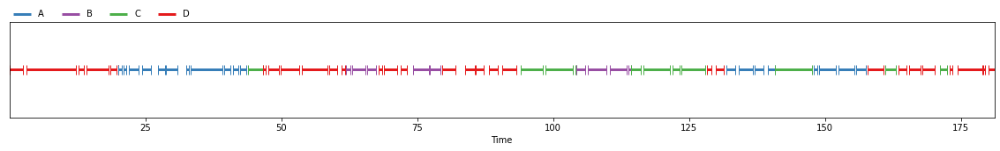

In [ ]:
result

In [ ]:
from utils import convert_diarized_result_to_list
diarized_result_list = convert_diarized_result_to_list(result)
print(diarized_result_list)

[{'start': 0.0, 'end': 20.0, 'tag': 'D'}, {'start': 20.0, 'end': 43.81, 'tag': 'A'}, {'start': 43.81, 'end': 46.6, 'tag': 'C'}, {'start': 46.6, 'end': 61.94, 'tag': 'D'}, {'start': 61.94, 'end': 67.78, 'tag': 'B'}, {'start': 67.78, 'end': 73.87, 'tag': 'D'}, {'start': 73.87, 'end': 79.44, 'tag': 'B'}, {'start': 79.44, 'end': 93.76, 'tag': 'D'}, {'start': 93.76, 'end': 104.3, 'tag': 'C'}, {'start': 104.3, 'end': 114.4, 'tag': 'B'}, {'start': 114.4, 'end': 128.21, 'tag': 'C'}, {'start': 128.21, 'end': 131.65, 'tag': 'D'}, {'start': 131.65, 'end': 140.9, 'tag': 'A'}, {'start': 140.9, 'end': 147.81, 'tag': 'C'}, {'start': 147.81, 'end': 157.78, 'tag': 'A'}, {'start': 157.78, 'end': 161.01, 'tag': 'D'}, {'start': 161.01, 'end': 163.35, 'tag': 'C'}, {'start': 163.35, 'end': 170.79999999999998, 'tag': 'D'}, {'start': 170.79999999999998, 'end': 172.85, 'tag': 'C'}, {'start': 172.85, 'end': 181.2, 'tag': 'D'}]


## improved result readability version

In [ ]:
# method = "Kmeans"
# audio: meeting.wav
prev_speaker = ""
count = 0
for turn, _, speaker in result.itertracks(yield_label=True):
  count += 1
  if prev_speaker == "":
    prev_start_time = turn.start
    prev_end_time = turn.end
    prev_speaker = speaker

  elif prev_speaker != speaker:
    turn_start_time = "{:.0f}:{:.0f}".format(prev_start_time//60, prev_start_time%60)
    turn_end_time = "{:.0f}:{:.0f}".format(prev_end_time//60, prev_end_time%60)
    print(f'Speaker "{prev_speaker}": {turn_start_time} - {turn_end_time}')
    prev_start_time = turn.start
    prev_speaker = speaker

  prev_end_time = turn.end

  if count == len(result):
    turn_start_time = "{:.0f}:{:.0f}".format(prev_start_time//60, prev_start_time%60)
    turn_end_time = "{:.0f}:{:.0f}".format(prev_end_time//60, prev_end_time%60)
    print(f'Speaker "{prev_speaker}": {turn_start_time} - {turn_end_time}')

Speaker "D": 0:0 - 0:20
Speaker "A": 0:20 - 0:44
Speaker "C": 0:44 - 0:47
Speaker "D": 0:47 - 1:2
Speaker "B": 1:2 - 1:7
Speaker "D": 1:8 - 1:13
Speaker "B": 1:14 - 1:19
Speaker "D": 1:20 - 1:33
Speaker "C": 1:34 - 1:44
Speaker "B": 1:44 - 1:54
Speaker "C": 1:54 - 2:8
Speaker "D": 2:8 - 2:11
Speaker "A": 2:12 - 2:21
Speaker "C": 2:21 - 2:28
Speaker "A": 2:28 - 2:38
Speaker "D": 2:38 - 2:41
Speaker "C": 2:41 - 2:43
Speaker "D": 2:44 - 2:50
Speaker "C": 2:51 - 2:52
Speaker "D": 2:53 - 3:1


# Experiment using silhouette method to find best K for K means

Speaker count from silhouette: 3 <br>
Actual speaker count: 4

In [ ]:
from main import full_pipeline
input = './data/test/meeting.wav'
full_pipeline(input)

File /content/gcloud_key.json was not found.


/usr/local/lib/python3.7/dist-packages/pyannote/audio/embedding/approaches/arcface_loss.py:170: FutureWarning:

The 's' parameter is deprecated in favor of 'scale', and will be removed in a future release



For n_clusters = 2 The average silhouette_score is : 0.29415327
For n_clusters = 3 The average silhouette_score is : 0.38351727
For n_clusters = 4 The average silhouette_score is : 0.26567262
For n_clusters = 5 The average silhouette_score is : 0.21766254
For n_clusters = 6 The average silhouette_score is : 0.17805329
For n_clusters = 7 The average silhouette_score is : 0.1666512
For n_clusters = 8 The average silhouette_score is : 0.15377933
For n_clusters = 9 The average silhouette_score is : 0.13494019
Best K: 3
[INFO]Number of Speakers: 3
[INFO]Speaker Diarization Time taken: 50.60 seconds


DefaultCredentialsError: ignored